# Project 1
## Detecting Moving Objects in DAS Recordings

Aleksandra Krasicka 148254

Project Goal: Develop an algorithm to detect and track moving objects in acoustic data collected from a Distributed Acoustic Sensing (DAS) system attached to the fiber optic cable at Jana Pawla II Street.

(Standard version 4)
Your task is to load the data, filter out the noise and process it in such a way that only moving objects (slanted lines) are visible. Then You need to determine the velocity for these objects (see the figure on the next page).

(Version for 5):
Instead of a single value of the object's speed, draw a graph of the speed changing over time.
Add clustering of objects into several groups differing in the nature of the signal, e.g. thick line, narrow line, objects with constant speed, objects with changing speed.

Distributed Acoustic Sensing (DAS) is an advanced technology that transforms optical fiber cables into highly sensitive vibration sensors. By sending pulses of laser light through a fiber optic cable and analyzing the backscattered light, DAS systems can detect subtle strain variations along the fiber, which may be caused by seismic activity, traffic, or small object movements. These variations are recorded as phase shifts in the backscattered light signal, which correlate directly to the fiber's strain. With appropriate calibration, these phase shifts are processed to measure strain or strain rate over time. The resulting time-series data provides a detailed, chronological record of vibrations along the fiber, allowing for further analysis to identify the source, magnitude, and frequency of disturbances.


Input Data:
The data is stored in numpy format as a 2D matrix. The particular value represents the strain rate of a fiber optic cable located on a busy street (Jana Pawla II). The data shows the passage of trams, trucks or cars along this street.
The first dimension is time, the second is space, in order to calculate the correct units use the following metadata:

* dx: 5.106500953873407 [m]
* dt: 0.0016 [s]
* file duration: 10s
* number of time samples in file: 6250
* file name format: HHMMSS
* files date: 2024-05-07


Selected data:

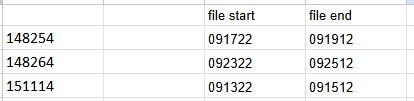

Requirements
* The implementation of the algorithm must be created in Python with use the following image processing libraries: OpenCV, NumPy, Matplotlib, Pillow, and Skimage. If You want to use other libraries, consult by e-mail (do not use neural networks or external tools).
* The solution must contain the source code and a report describing the algorithm along with a description of intermediate steps and the experiments performed (if you have tested several successful/unsuccessful solutions, describe them)
* The solution can be presented in the form of source code (.py) and an attached report (.pdf) or a jupyter notebook file ( .ipynyb and one of .pdf or .html) containing the code and description of the next steps
* Images in the report can be scaled down so that the report is not too large.
* All sources of data, code and inspiration must be reported with a description of what was used.

The project can be done in pairs.

Deadline for sending the code, and report: 4.12.2024 23:59

The project will be presented in class 4.12.2024


## Data

Data was selected and stored in a zip in github repository.

Repository: https://github.com/senketsutsu/CV_project1

https://github.com/senketsutsu/CV_project1/raw/refs/heads/main/data.zip

In [1]:
!wget -O data.zip https://github.com/senketsutsu/CV_project1/raw/refs/heads/main/data.zip && unzip -q -o data.zip

--2024-12-04 13:00:36--  https://github.com/senketsutsu/CV_project1/raw/refs/heads/main/data.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/senketsutsu/CV_project1/refs/heads/main/data.zip [following]
--2024-12-04 13:00:37--  https://raw.githubusercontent.com/senketsutsu/CV_project1/refs/heads/main/data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20268121 (19M) [application/zip]
Saving to: ‘data.zip’

data.zip            100%[===================>]  19.33M  --.-KB/s    in 0.1s    

2024-12-04 13:00:38 (164 MB/s) - ‘data.zip’ saved [20268121/20268121]



In [2]:
import numpy as np

import matplotlib.pyplot as plt
from datetime import datetime
import pandas as pd
import datetime
import glob
from matplotlib.colors import Normalize
from google.colab.patches import cv2_imshow
import cv2
from skimage import img_as_bool, io, color, morphology


def set_axis(x, no_labels = 7)->tuple[np.array, np.array]:
    """Sets the x-axis positions and labels for a plot.

    Args:
        x (np.array): The x-axis data.
        no_labels (int, optional): The number of labels to display. Defaults to 7.

    Returns:
        tuple[np.array, np.array]: A tuple containing:
            - The positions of the labels on the x-axis.
            - The labels themselves.
    """
    nx = x.shape[0]
    step_x = int(nx / (no_labels - 1))
    x_positions = np.arange(0,nx,step_x)
    x_labels = x[::step_x]
    return x_positions, x_labels


In [3]:
path_out = 'data/'
files = glob.glob(path_out+"*")
files.sort()


In [4]:

dx= 5.106500953873407
dt= 0.0016


dataset_1 = []
first_filename = files[0]
for file in files[:12]:
   dataset_1.append(np.load(file))
dataset_1 = np.concatenate(dataset_1)

dataset_2 = []
for file in files[12:24]:
   dataset_2.append(np.load(file))
dataset_2 = np.concatenate(dataset_2)

dataset_3 = []
first_filename = files[0]
for file in files[24:]:
   dataset_3.append(np.load(file))
dataset_3 = np.concatenate(dataset_3)

time_start = datetime.datetime.strptime('2024-05-07 ' + first_filename.split("/")[-1].split(".")[0], "%Y-%m-%d %H%M%S")
index = pd.date_range(start=time_start, periods=len(dataset_1), freq=f'{dt}s')


columns = np.arange(len(dataset_1[0])) * dx


df = pd.DataFrame(data=dataset_1, index=index, columns=columns)


In [102]:
dataset_1.shape

(75000, 52)

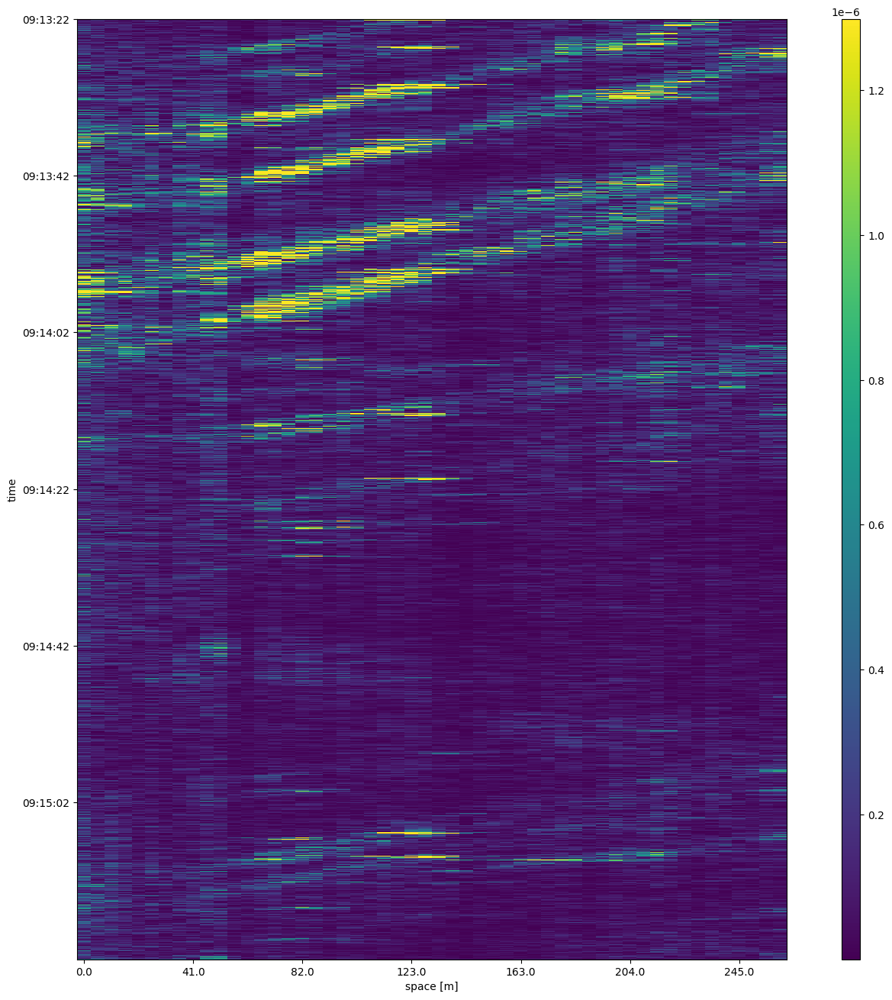

In [5]:
fig = plt.figure(figsize=(12,16))
ax = plt.axes()

# This is an example transformation and should be converted to the proper algorithm
df -= df.mean()
df = np.abs(df)
low, high = np.percentile(df, [1, 99])
norm = Normalize(vmin=low, vmax=high, clip=True)

im = ax.imshow(df,interpolation='none',aspect='auto',norm=norm)
plt.ylabel('time')
plt.xlabel('space [m]')

cax = fig.add_axes([ax.get_position().x1+0.06,ax.get_position().y0,0.02,ax.get_position().height])
plt.colorbar(im, cax=cax)
x_positions, x_labels = set_axis(df.columns)
ax.set_xticks(x_positions, np.round(x_labels))
y_positions, y_labels = set_axis(df.index.time)
ax.set_yticks(y_positions, y_labels)
plt.show()


In [6]:
np_image = df.values

In [7]:
np_image

array([[3.3314166e-07, 1.9841958e-07, 1.5281761e-07, ..., 2.5930987e-07,
        2.5627513e-08, 3.9526149e-08],
       [3.2060800e-07, 2.2599365e-07, 1.3025701e-07, ..., 3.0693781e-07,
        7.0748719e-08, 6.3249928e-08],
       [2.8802046e-07, 2.1596671e-07, 1.1270986e-07, ..., 2.1669540e-07,
        7.2135101e-08, 2.4485749e-08],
       ...,
       [1.1004237e-07, 3.5306184e-07, 2.0815204e-07, ..., 5.1250971e-08,
        2.5875374e-07, 3.3147043e-07],
       [1.8023091e-07, 2.6783289e-07, 1.8308471e-07, ..., 2.1444306e-08,
        1.9357867e-07, 2.2117416e-07],
       [2.4289926e-07, 1.8260394e-07, 1.5551065e-07, ..., 1.1162984e-09,
        2.3368641e-07, 2.1114722e-07]], dtype=float32)

The 3 datasets that are used for this project are now
usunąć wysokie częstotliwości, żeby znaleźć najwyższe freq  

In [8]:
dataset_1

array([[-3.33395576e-07, -1.98031969e-07, -1.52910758e-07, ...,
         2.58193580e-07, -2.50673367e-08,  4.01077394e-08],
       [-3.20861915e-07, -2.25606030e-07, -1.30350159e-07, ...,
         3.05821516e-07, -7.01885412e-08, -6.26683416e-08],
       [-2.88274379e-07, -2.15579092e-07, -1.12803015e-07, ...,
         2.15579092e-07,  7.26952791e-08,  2.50673367e-08],
       ...,
       [-1.10296284e-07,  3.53449451e-07,  2.08058893e-07, ...,
         5.01346733e-08, -2.58193580e-07, -3.30888838e-07],
       [-1.80484832e-07,  2.68220504e-07,  1.82991556e-07, ...,
        -2.25606041e-08, -1.93018494e-07, -2.20592568e-07],
       [-2.43153181e-07,  1.82991556e-07,  1.55417496e-07, ...,
         0.00000000e+00, -2.33126229e-07, -2.10565631e-07]], dtype=float32)

Normalize the datasets

In [9]:
def preprocess(arr):
  # initiallby based on the preprocessing provided before ploting (above)
  # df -= df.mean()
  # df = np.abs(df)
  # low, high = np.percentile(df, [3, 99])
  # norm = Normalize(vmin=low, vmax=high, clip=True)

  df = arr.copy()
  df -= np.mean(df)
  df = np.abs(df)
  low, high = np.percentile(df, [3, 98])
  df_clipped = np.clip(df, low, high)
  df_normalized = (df_clipped - low) / (high - low)

  return df_normalized

In [10]:
def im_show(arr):
  # based on the ploting function above
  # the time is alvays the same for convinnance
  fig = plt.figure(figsize=(6,8))
  ax = plt.axes()

  df = pd.DataFrame(data=arr, index=index, columns=columns)

  im = ax.imshow(df,interpolation='none',aspect='auto', cmap='gray')
  plt.ylabel('time')
  plt.xlabel('space [m]')

  cax = fig.add_axes([ax.get_position().x1+0.06,ax.get_position().y0,0.02,ax.get_position().height])
  plt.colorbar(im, cax=cax)
  x_positions, x_labels = set_axis(df.columns)
  ax.set_xticks(x_positions, np.round(x_labels))
  y_positions, y_labels = set_axis(df.index.time)
  ax.set_yticks(y_positions, y_labels)
  plt.show()


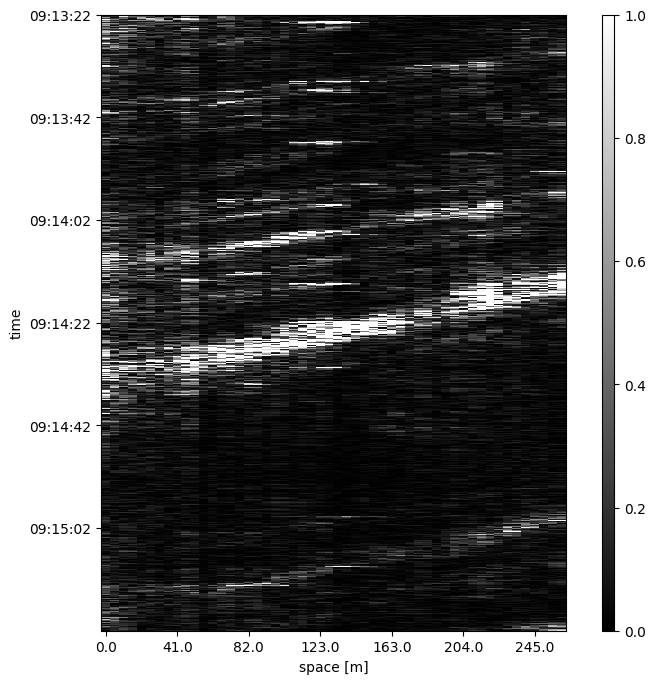

In [11]:
im_show(preprocess(dataset_2))

## View data

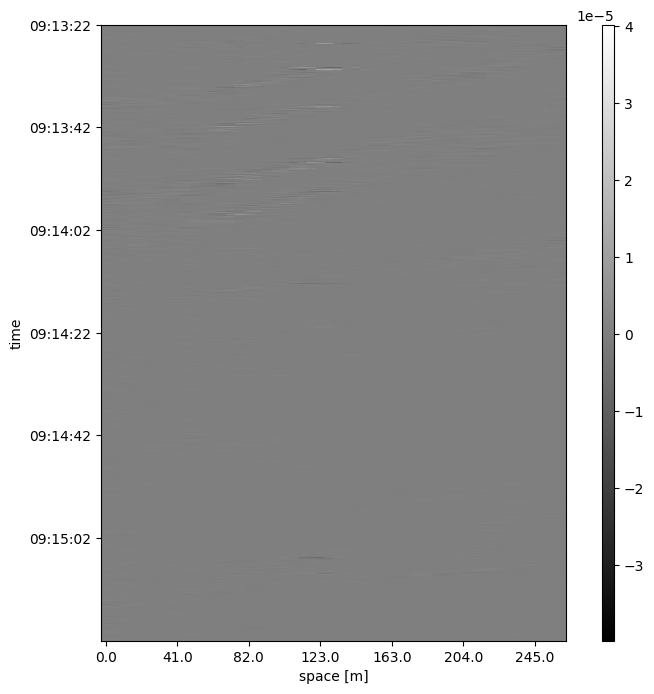

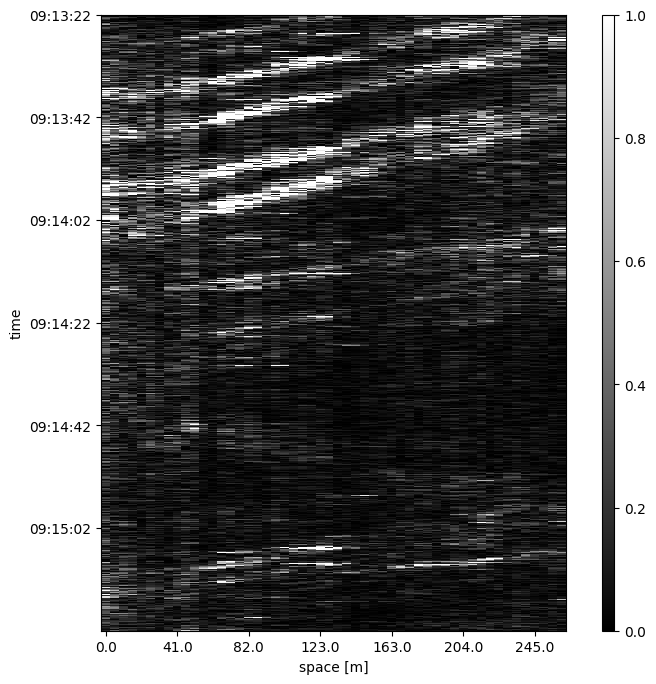

In [12]:
im_show(dataset_1)
im_show(preprocess(dataset_1))

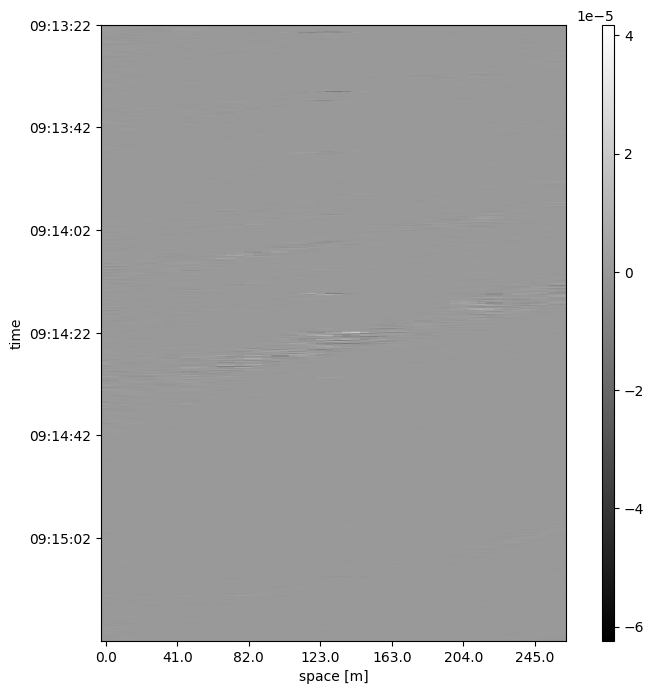

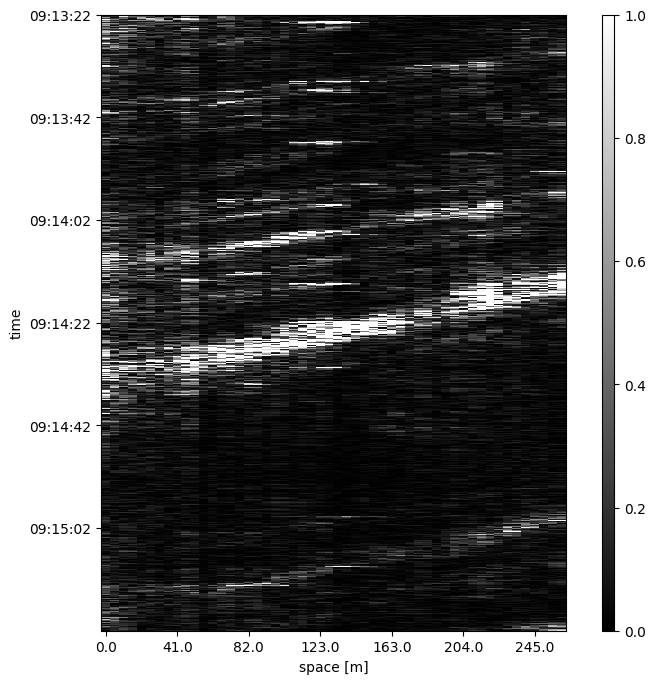

In [13]:
im_show(dataset_2)
im_show(preprocess(dataset_2))

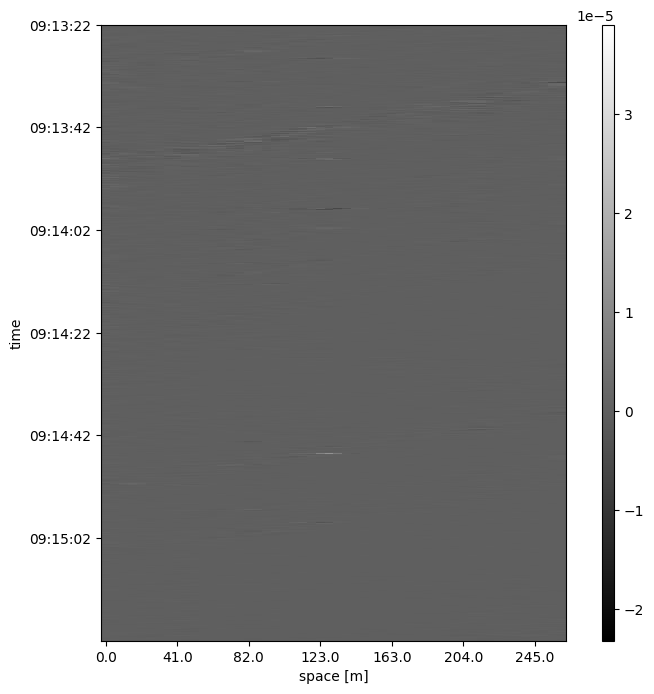

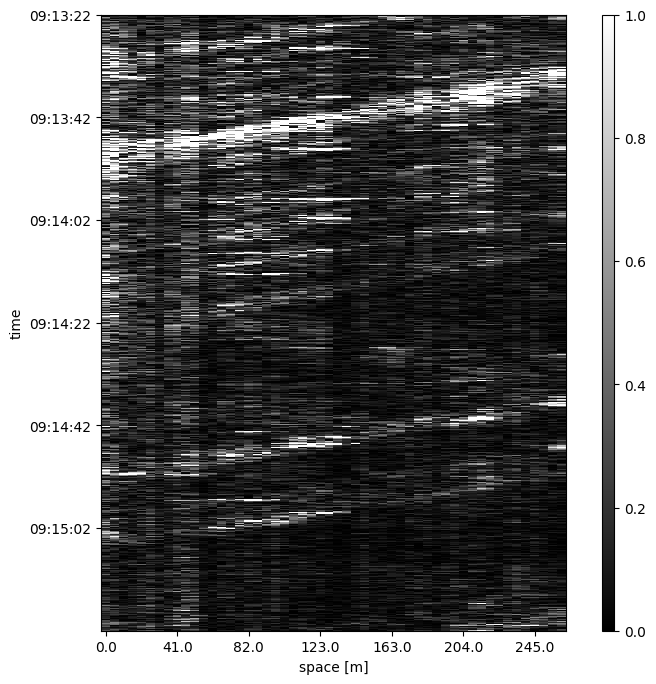

In [14]:
im_show(dataset_3)
im_show(preprocess(dataset_3))

### Values distribiution

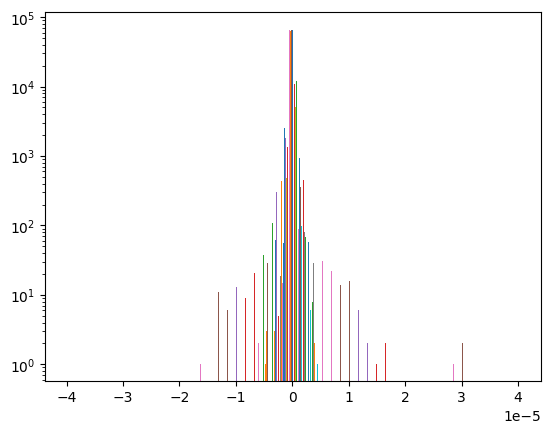

In [15]:
plt.hist(dataset_1, 100, log=True)
plt.show()

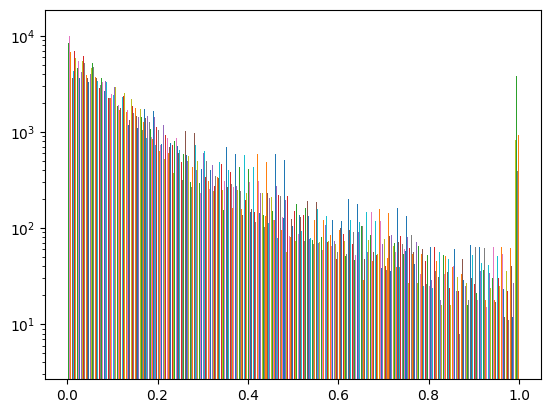

In [16]:
plt.hist(preprocess(dataset_1), 100, log=True)
plt.show()

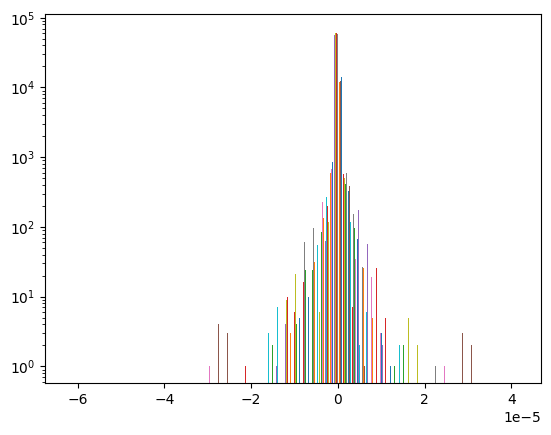

In [17]:
plt.hist(dataset_2, 100, log=True)
plt.show()

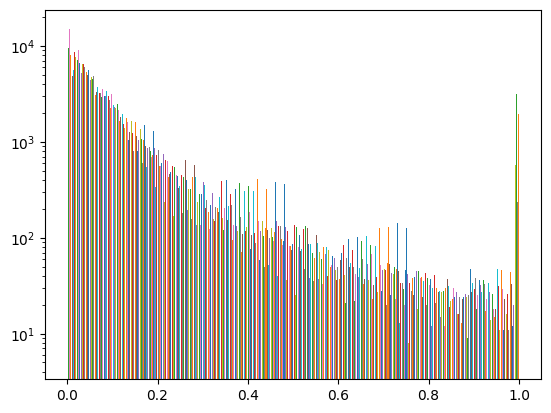

In [18]:
plt.hist(preprocess(dataset_2), 100, log=True)
plt.show()

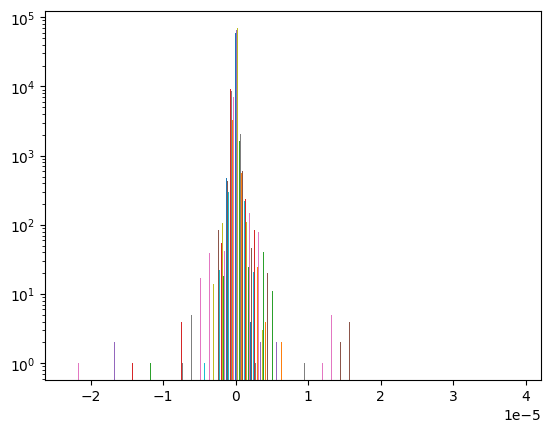

In [19]:
plt.hist(dataset_3, 100, log=True)
plt.show()

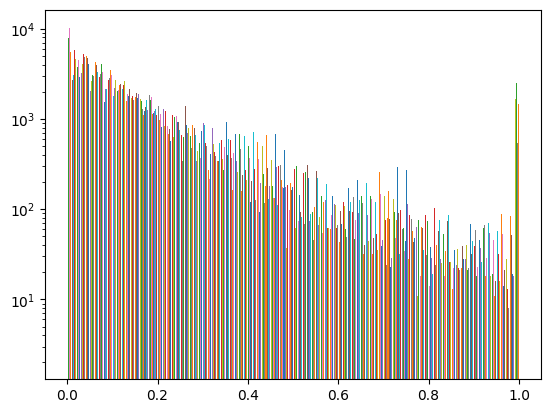

In [20]:
plt.hist(preprocess(dataset_3), 100, log=True)
plt.show()

## Process

Now we can get rid of the noise, apply the denois using FFT as here: https://medium.com/@joshiprerak123/enhancing-sound-quality-denoising-audio-with-fft-using-python-7a1d1c8c18e6

### Final function

In [21]:
!pip install noisereduce
!pip install pedalboard

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 39.4 MB/s eta 0:00:00


In [22]:
from pedalboard.io import AudioFile
from pedalboard import *
import noisereduce as nr

In [118]:
from scipy.ndimage import median_filter
import plotly.graph_objects as go

In [24]:
from scipy.ndimage import sobel

In [25]:
def automedian(img, struct):
  Qimg_space_open = cv2.morphologyEx(img, cv2.MORPH_OPEN, struct)
  Qimg_space_close = cv2.morphologyEx(Qimg_space_open, cv2.MORPH_CLOSE, struct)
  Qimg_space_open2 = cv2.morphologyEx(Qimg_space_close, cv2.MORPH_OPEN, struct)

  img_space_close = cv2.morphologyEx(img, cv2.MORPH_CLOSE, struct)
  img_space_open = cv2.morphologyEx(img_space_close, cv2.MORPH_OPEN, struct)
  img_space_close2 = cv2.morphologyEx(img_space_open, cv2.MORPH_CLOSE, struct)
  img_space_Q = np.minimum(img, img_space_close2)

  img_space_G = np.maximum(Qimg_space_open2, img_space_Q)

  return(img_space_G)

In [178]:
def process(dataset_1):
  # denoising
  pre_1 = preprocess(dataset_1)
  pre_1_flat = pre_1.flatten()
  sr=44100
  dx = 5.106500953873407
  dt = 0.0016

  reduced_noise = nr.reduce_noise(y=pre_1_flat, sr=sr, stationary=True, prop_decrease=0.5)

  board = Pedalboard([
      NoiseGate(threshold_db=-35, ratio=2.0, release_ms=250),
      Compressor(threshold_db=-18, ratio=3, release_ms=200),
      LowShelfFilter(cutoff_frequency_hz=300, gain_db=7, q=1.5),
      Gain(gain_db=2)
  ])

  effected = board(reduced_noise, sr)
  effected_2d = effected.reshape(dataset_1.shape)
  norm_effected_2d = effected_2d / np.max(effected_2d)
  effected_2d += preprocess(dataset_1)
  filtered_2d_resized = cv2.resize(effected_2d*255, (500, 750), interpolation=cv2.INTER_LINEAR)

  # median filter
  struct = np.ones([5, 5], np.uint8)
  img_space_automedian = automedian(filtered_2d_resized, struct)
  img_space_automedian = (img_space_automedian / np.max(img_space_automedian) * 255).astype(np.uint8)
  filtered_2d = median_filter(img_space_automedian, size=3)
  filtered_2d = median_filter(filtered_2d, size=3)

  filtered_2d_norm = ((filtered_2d) ).astype(np.uint8)
  kernel_sharpening = np.array([[-1, -1, -1],
                                [-1, 9, -1],
                                [-1, -1, -1]])
  sharpened = cv2.filter2D(filtered_2d_norm, -1, kernel_sharpening)

  kernel = np.ones((3, 3), np.uint8)
  img_dilation  = cv2.dilate(cv2.GaussianBlur(sharpened, (5, 5), 0), kernel, iterations=1) # TU
  # cv2_imshow(img_dilation)
  img_erosion = cv2.erode(img_dilation , kernel, iterations=1 )
  # cv2_imshow(img_erosion)

  median_filter_2d = automedian(img_dilation, kernel)
  blurred = cv2.GaussianBlur(median_filter_2d, (31, 31), 0)
  max_val = np.max(np.abs(blurred))
  median_filter_2d[blurred < 0.2 * max_val] = 0


  arr_resized = cv2.resize(median_filter_2d, (50, 75), interpolation=cv2.INTER_LINEAR)
  equalized = cv2.equalizeHist(arr_resized)
  arr_resized2 = cv2.resize(equalized, (500, 750), interpolation=cv2.INTER_LINEAR)

  # Skeleton
  img_erosion_resized = cv2.resize(arr_resized2, (500, 750), interpolation=cv2.INTER_LINEAR)
  thinned_image = morphology.medial_axis(img_erosion_resized > 75)
  img_dilation  = cv2.dilate((thinned_image * 255).astype(np.uint8), np.ones((3, 3), np.uint8), iterations=1)

  # cv2_imshow(img_dilation)

  lines = cv2.HoughLinesP(
      img_dilation,
      rho=1,             # Distance resolution in pixels
      theta=np.pi / 180,  # Angle resolution in radians
      threshold=100,      # Minimum number of votes for a line
      minLineLength=60,    # Minimum length of line
      maxLineGap=25       # Maximum gap between lines
  )
  # print(len(lines))

  # fig = plt.figure(figsize=(6, 8))
  # ax = plt.axes()

  df = pd.DataFrame(data=img_erosion)

  # im = ax.imshow(df, interpolation='none', aspect='auto', cmap='gray')
  # plt.ylabel('Time')
  # plt.xlabel('Space [m]')

  # cax = fig.add_axes([ax.get_position().x1 + 0.06, ax.get_position().y0, 0.02, ax.get_position().height])
  # plt.colorbar(im, cax=cax)

  fig = go.Figure()

  fig.add_trace(go.Heatmap(
      z=img_erosion,
      colorscale='gray',
      showscale=True,
      colorbar=dict(title='Intensity'),
      hoverinfo='none'
  ))

  if lines is not None:
      for line in lines:
          x1, y1, x2, y2 = line[0]
          if np.abs(x1 - x2) > 0 and np.abs(y1 - y2) > 0 and np.abs(y1 - y2) <= 2* np.abs(x1 - x2):

              # (75000, 52)
              x1n = x1 *52/500
              x2n = x2 *52/500
              y1n = y1 *75000/750
              y2n = y2 *75000/750
              x1n *= dx # m
              x2n *= dx
              y1n *= dt # s
              y2n *= dt
              v = ((np.abs(x1n-x2n)/1000)/(np.abs(y1n-y2n)/3600))

              mid_x = (x1 + x2) / 2
              mid_y = (y1 + y2 + 40) / 2

              # ax.plot([x1, x2], [y1, y2], color='red', linewidth=2)
              # ax.text(mid_x, mid_y, f"{v:.2f} km/h", color='red', fontsize=12, ha='center')
              if v>25:
                mod = min(v // 100, 2)
                color_map = ['red', 'blue', 'green']
                selected_color = color_map[int(mod)]
                fig.add_trace(go.Scatter(
                      x=[x1, x2],
                      y=[y1, y2],
                      mode='lines',
                      line=dict(color=selected_color, width=2),
                      hoverinfo='text',
                      text=f"Velocity: {v:.2f} km/h"
                  ))



  # plt.show()

  fig.update_layout(
      title='Final result',
      xaxis_title='m',
      yaxis_title='s',
      xaxis=dict(scaleanchor="y", constrain="domain"),
      yaxis=dict(autorange="reversed")
  )

  fig.show()

The speed is as hoverinfo, when it was printed they were not readable.

red --> speed at most 100

blue --> speed at most 200

green --> speed more than 200

In [181]:
process(dataset_1)

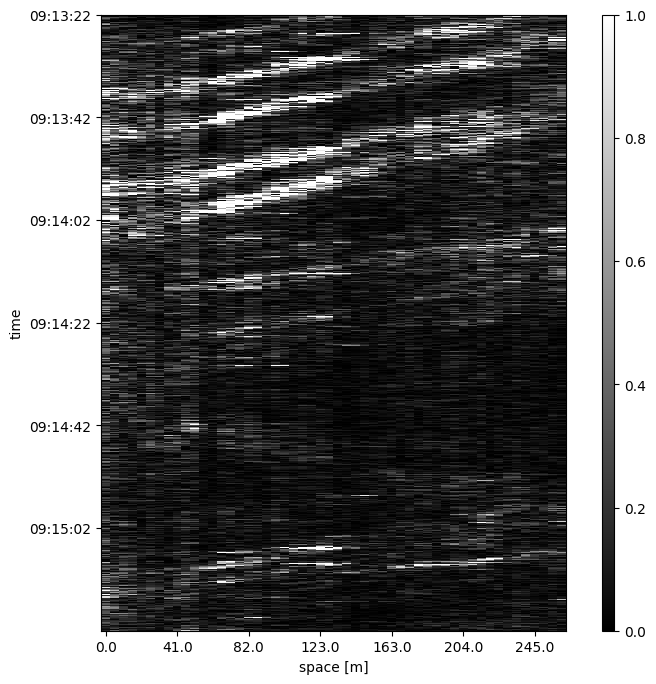

In [182]:
im_show(preprocess(dataset_1))

In [171]:
process(dataset_2)

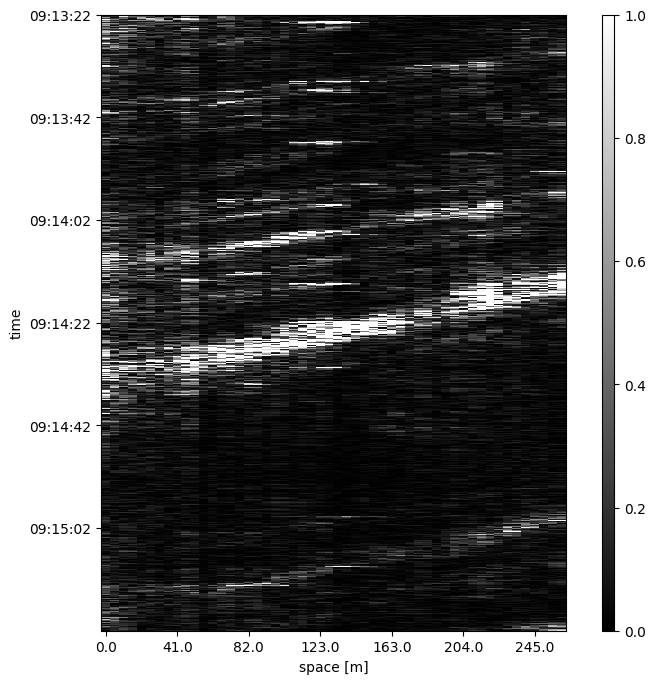

In [172]:
im_show(preprocess(dataset_2))

In [173]:
process(dataset_3)

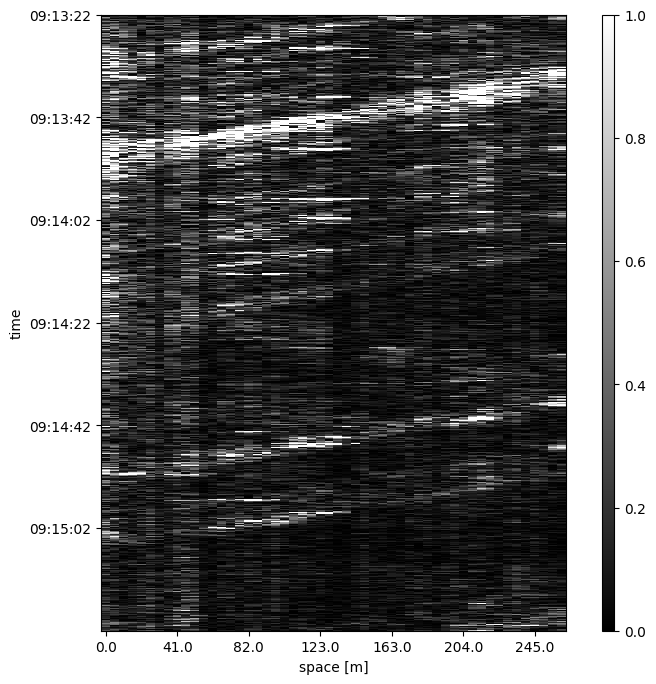

In [174]:
im_show(preprocess(dataset_3))

### Denoising

https://medium.com/@joshiprerak123/enhancing-sound-quality-denoising-audio-with-fft-using-python-7a1d1c8c18e6

In [28]:
pre_1 = preprocess(dataset_1)

In [29]:
def denoise_fft(noisy_signal, threshold):
  """Denoises a signal using FFT.

  Args:
    noisy_signal: The noisy signal.
    threshold: The threshold for filtering frequency components.

  Returns:
    A numpy array representing the denoised signal.
  """

  fft_signal = np.fft.fft(noisy_signal)
  fft_signal[np.abs(fft_signal) < threshold] = 0
  denoised_signal = np.real(np.fft.ifft(fft_signal))
  return denoised_signal

In [30]:
pre_1_flat = pre_1.flatten()

In [183]:
threshold = 10
denoised_signal = denoise_fft(pre_1_flat, threshold)

In [184]:
denoised_signal_2d = denoised_signal.reshape(dataset_1.shape)

before:

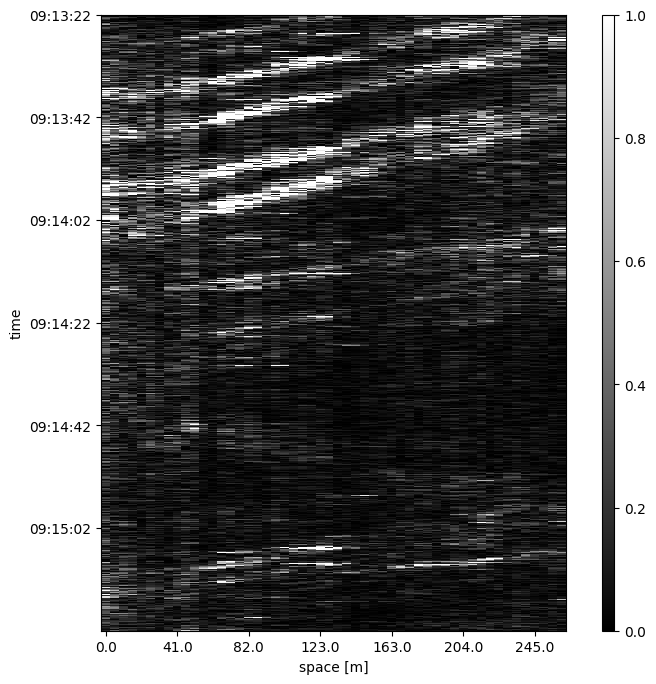

In [185]:
im_show(preprocess(dataset_1))

after:

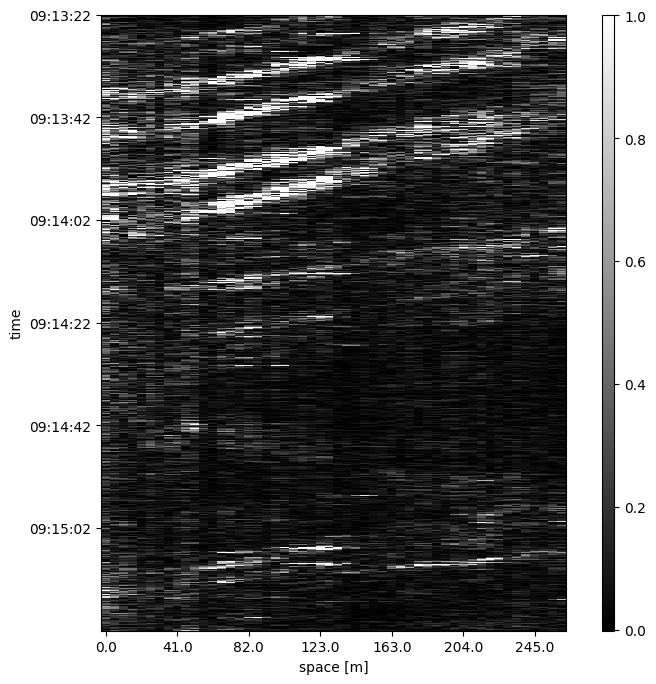

In [186]:
im_show(denoised_signal_2d)

Since this approach wasnt giving as good results as I hoped for we try another one.

### Second approach

https://medium.com/@joshiprerak123/transform-your-audio-denoise-and-enhance-sound-quality-with-python-using-pedalboard-24da7c1df042

In [35]:
sr=44100

reduced_noise = nr.reduce_noise(y=pre_1_flat, sr=sr, stationary=True, prop_decrease=0.5)

board = Pedalboard([
    NoiseGate(threshold_db=-35, ratio=2.0, release_ms=250),
    Compressor(threshold_db=-18, ratio=3, release_ms=200),
    LowShelfFilter(cutoff_frequency_hz=300, gain_db=7, q=1.5),
    Gain(gain_db=2)
])

effected = board(reduced_noise, sr)

In [36]:
effected_2d = effected.reshape(dataset_1.shape)

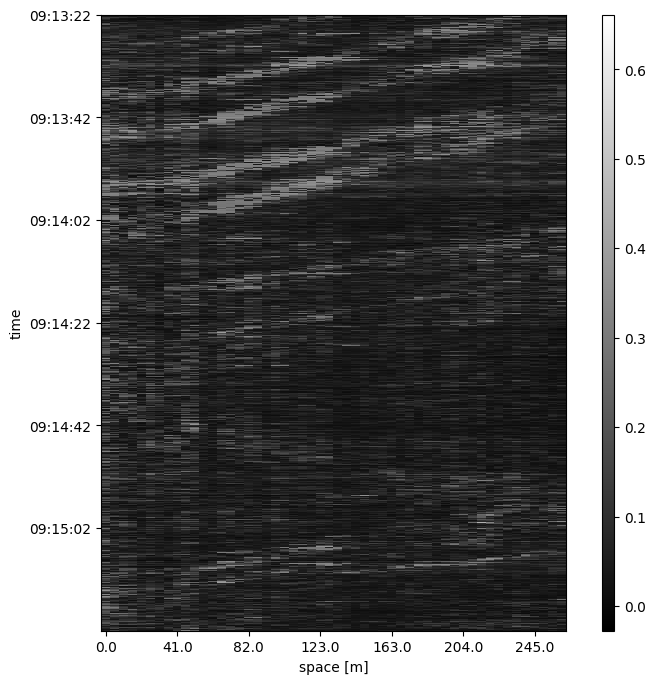

In [37]:
im_show(effected_2d)

In [38]:
norm_effected_2d = effected_2d / np.max(effected_2d)

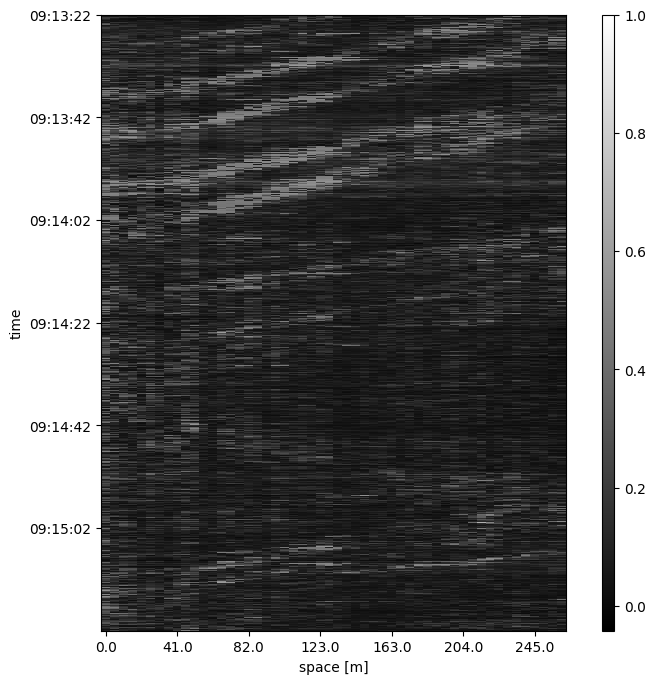

In [39]:
im_show(norm_effected_2d)

well it still is not satisfactory

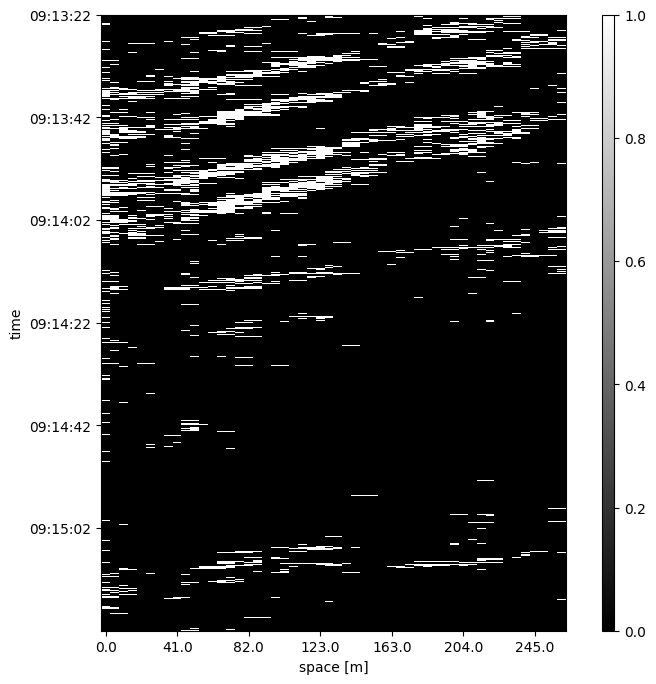

In [40]:
im_show((pre_1 > 0.45 ).astype(int))

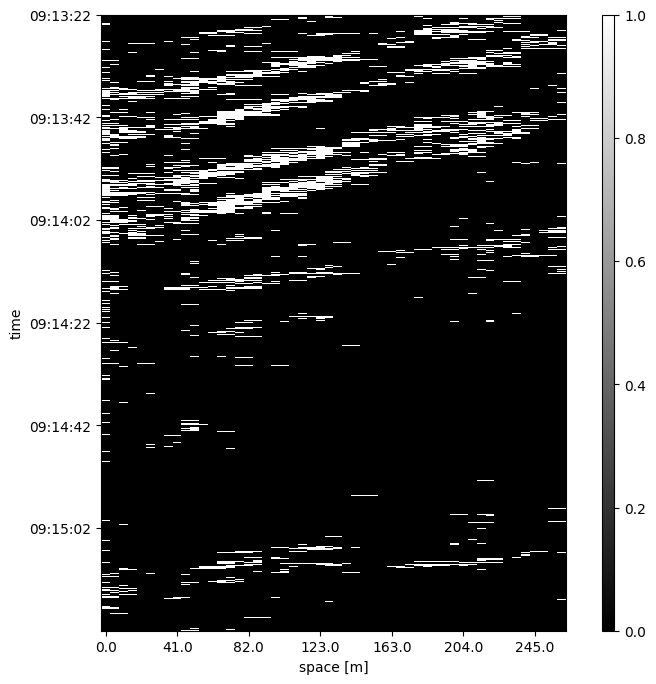

In [41]:
im_show(((preprocess(dataset_1) > 0.45) & (preprocess(dataset_1) < 2.0)).astype(int))

In [42]:
effected_2d += preprocess(dataset_1)

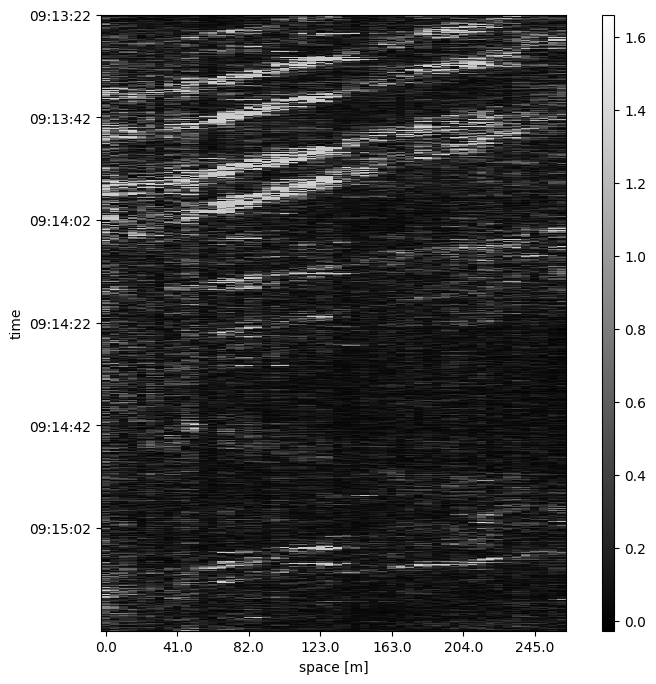

In [43]:
im_show(effected_2d)

In [44]:
filtered_2d_resized = cv2.resize(effected_2d*255, (500, 750), interpolation=cv2.INTER_LINEAR)

In [45]:
struct = np.ones([5, 5], np.uint8)

In [46]:
img_space_automedian = automedian(filtered_2d_resized, struct)

In [47]:
img_space_automedian.dtype

dtype('float32')

In [48]:
img_space_automedian = (img_space_automedian / np.max(img_space_automedian) * 255).astype(np.uint8)

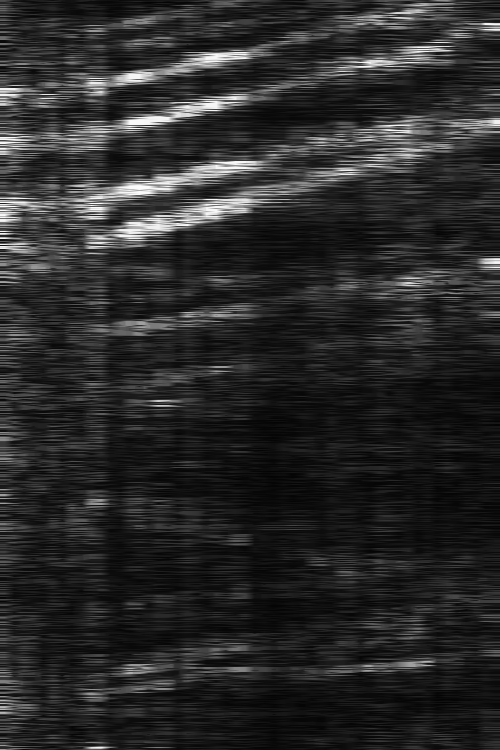

In [49]:
cv2_imshow(img_space_automedian)

In [50]:
filtered_2d = median_filter(img_space_automedian, size=3)

In [51]:
filtered_2d = median_filter(filtered_2d, size=3)

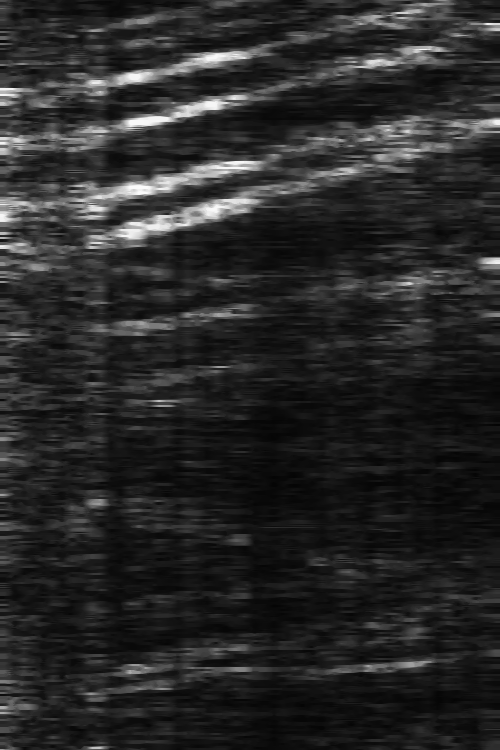

In [52]:
cv2_imshow(filtered_2d)

In [53]:
thresh = cv2.threshold(img_space_automedian, 128, 255, cv2.THRESH_BINARY)[1]

In [54]:
params = cv2.SimpleBlobDetector_Params()

params.filterByArea = True
params.minArea = 100
params.filterByCircularity = False
params.filterByConvexity = False
params.filterByInertia = False

detector = cv2.SimpleBlobDetector_create(params)

In [55]:
keypoints = detector.detect(np.uint8(img_space_automedian))

In [56]:
img_with_keypoints = cv2.drawKeypoints(np.uint8(img_space_automedian), keypoints, np.array([]), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

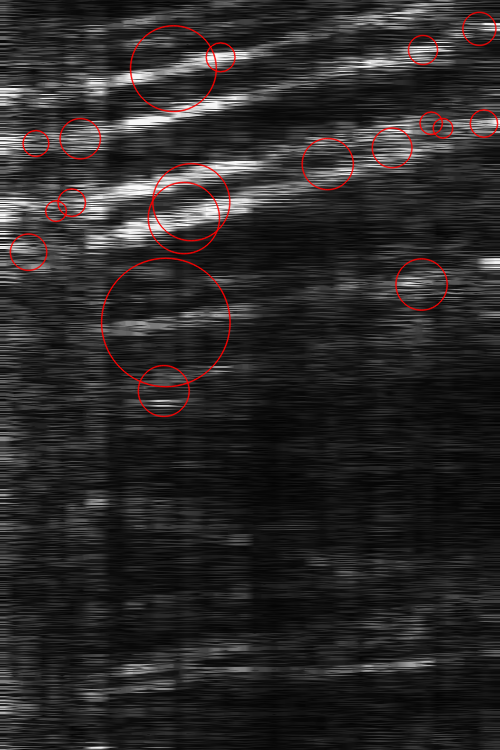

In [57]:
cv2_imshow(img_with_keypoints)

Now its better!

Trying other approach (not used in final processing)

https://www.youtube.com/watch?v=qe4fpdNzfxU&ab_channel=VeenaSarda

In [58]:
img = ((filtered_2d)).astype(np.uint8)

c = 100

log_image = c * np.log(1 + img.astype(np.float64))

log_image_normalized = cv2.normalize(log_image, None, 0, 255, cv2.NORM_MINMAX)
log_image_uint8 = np.uint8(log_image_normalized)

In [59]:
c=255 / np.log(1 + np.max(img))
log_image =  c * (np.log(img + 1))

#specify the data type so that float value will be converted into int
log_image = np.array(log_image, dtype = np.uint8)

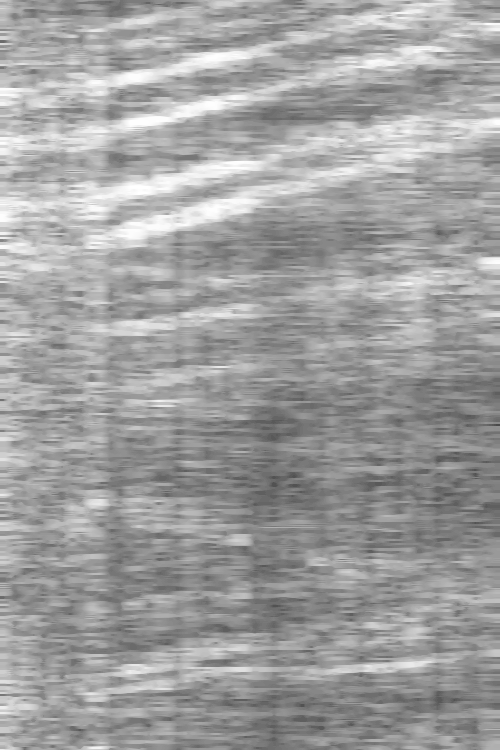

In [60]:
cv2_imshow(log_image)

In [61]:
gamma = 1.2
img_2 = np.power(img,gamma)

In [62]:
img_2 = img_2 / np.max(img_2) * 255

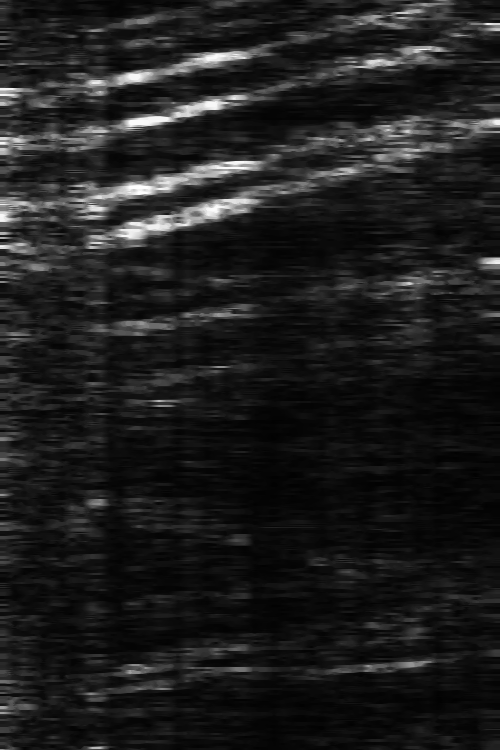

In [63]:
cv2_imshow(img_2)

### Line detection


https://www.geeksforgeeks.org/line-detection-python-opencv-houghline-method/?fbclid=IwZXh0bgNhZW0CMTEAAR2Frm_pQV40IcPH5w6T4kn2wIgdhRIlRb4qVv_yypfft-nwY2yEqv8zd04_aem_3sLqJJdvnVbpYLe9QfhSyA


#### More denoise

In [64]:
filtered_2d_norm = ((filtered_2d) ).astype(np.uint8)  # TU

In [65]:
normalized_img_2 = (img_2 - img_2.min()) / (img_2.max() - img_2.min()) * 255

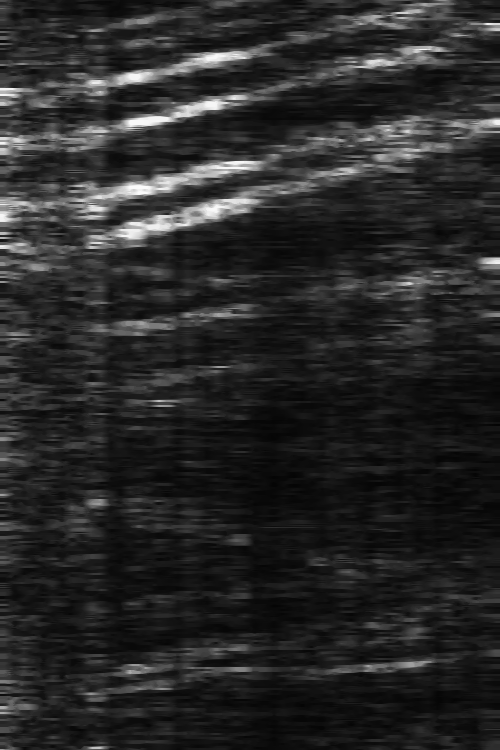

In [66]:
cv2_imshow(filtered_2d_norm)

In [189]:
kernel_sharpening = np.array([[-1, -1, -1],
                              [-1, 9, -1],
                              [-1, -1, -1]])
sharpened = cv2.filter2D(filtered_2d_norm, -1, kernel_sharpening)  # TU

# Apply Canny Edge Detection with adjusted thresholds
edges = cv2.Canny(sharpened, 10, 100)

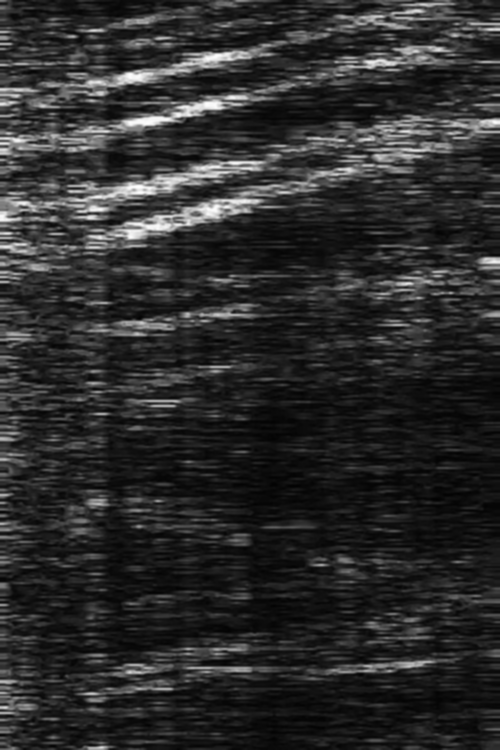

In [190]:
cv2_imshow(cv2.GaussianBlur(sharpened, (5, 5), 0))

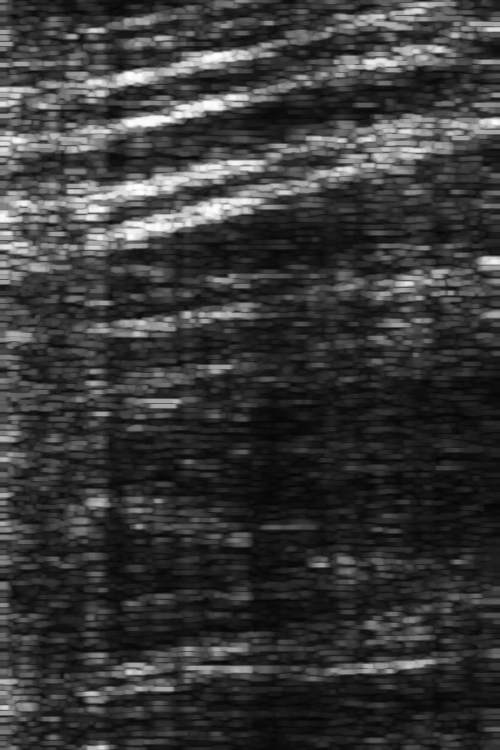

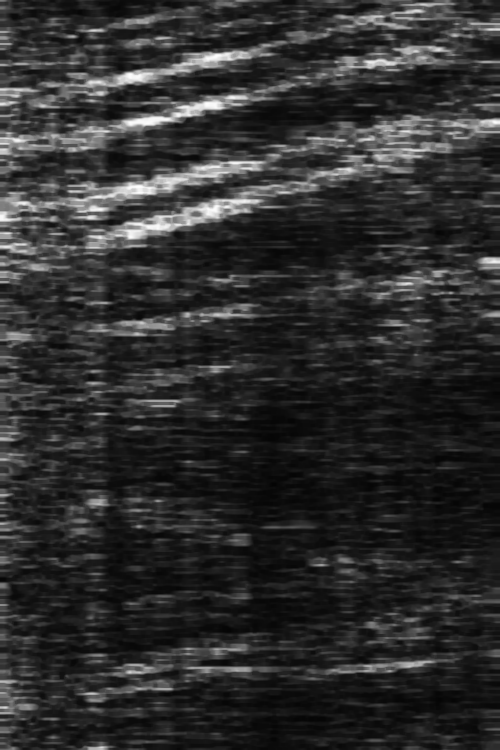

In [69]:
kernel = np.ones((3, 3), np.uint8)

img_dilation  = cv2.dilate(cv2.GaussianBlur(sharpened, (5, 5), 0), kernel, iterations=1) # TU
cv2_imshow(img_dilation)
img_erosion = cv2.erode(img_dilation , kernel, iterations=1 )
cv2_imshow(img_erosion)
# img_dilation  = cv2.dilate(img_erosion, kernel , iterations=2)
# cv2_imshow(img_dilation)
# img_erosion = cv2.erode(img_dilation , kernel, iterations=1)
# cv2_imshow(img_erosion)

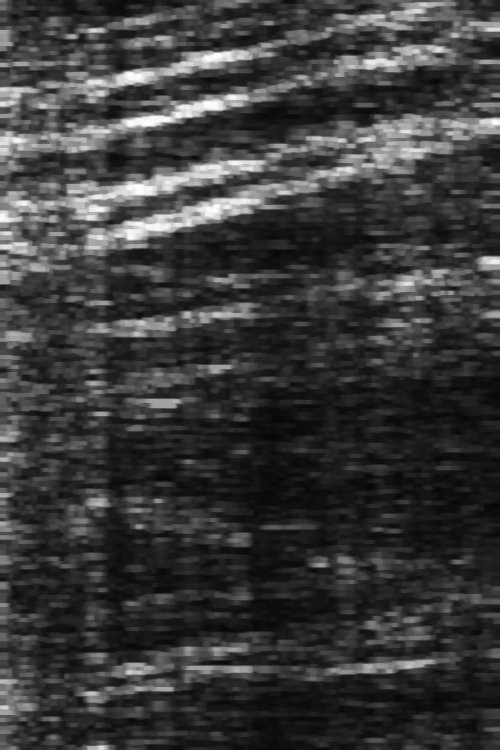

In [70]:
median_filter_2d = automedian(img_dilation, kernel) # TU
cv2_imshow(median_filter_2d)

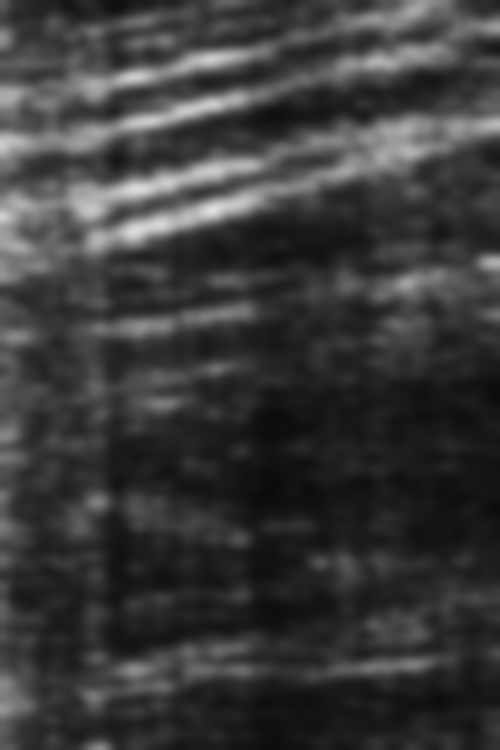

In [71]:
blurred = cv2.GaussianBlur(median_filter_2d, (31, 31), 0)  # TU
cv2_imshow(blurred)

In [72]:
np.max(np.abs(blurred))

223

In [73]:
max_val = np.max(np.abs(blurred))
median_filter_2d[blurred < 0.2 * max_val] = 0  # TU

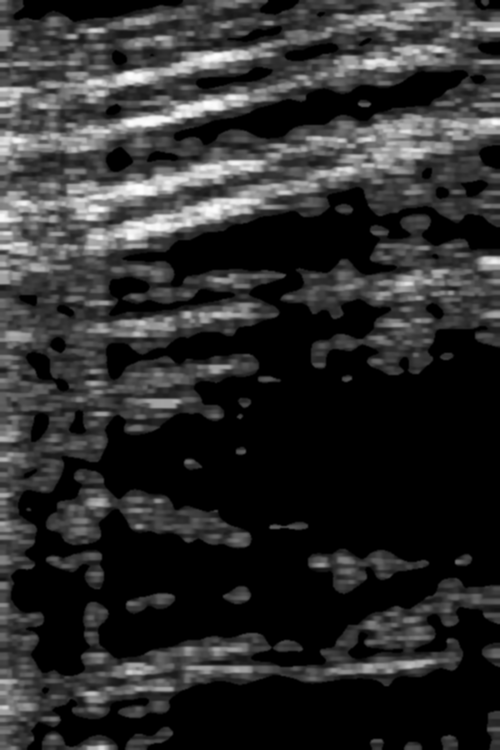

In [74]:
cv2_imshow(cv2.GaussianBlur(median_filter_2d, (3, 3), 0))

In [75]:
arr_resized = cv2.resize(median_filter_2d, (50, 75), interpolation=cv2.INTER_LINEAR) # TU

In [76]:
# arr_resized = cv2.resize(img_erosion, (50, 75), interpolation=cv2.INTER_LINEAR)

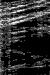

In [77]:
cv2_imshow(arr_resized)

In [78]:
equalized = cv2.equalizeHist(arr_resized)  # TU

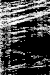

In [79]:
cv2_imshow(equalized)

In [80]:
sobel_edges = sobel(255-median_filter_2d, axis=0, mode='constant')

In [81]:
edges = cv2.Canny( equalized, 50, 200, apertureSize=3)

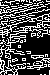

In [82]:
cv2_imshow(edges)

In [83]:
arr_resized2 = cv2.resize(equalized, (500, 750), interpolation=cv2.INTER_LINEAR) # TU

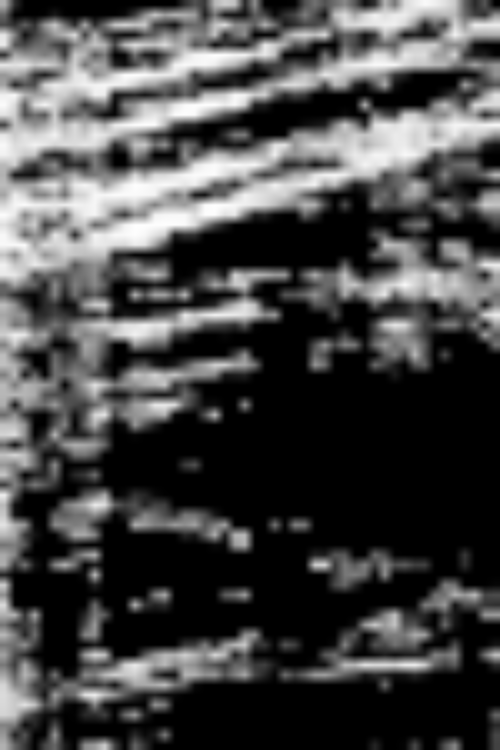

In [84]:
cv2_imshow(arr_resized2)

#### Skeleton

now i will work with this image

In [85]:
img_erosion_resized = cv2.resize(arr_resized2, (500, 750), interpolation=cv2.INTER_LINEAR)

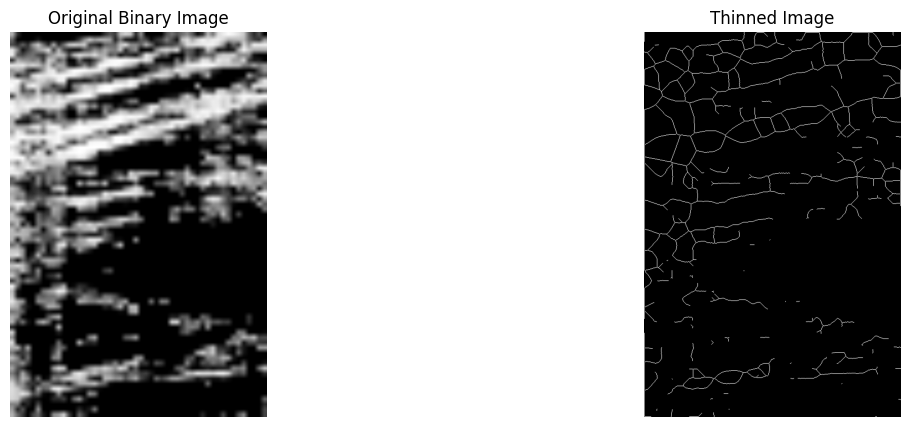

In [86]:
thinned_image = morphology.medial_axis(img_erosion_resized > 75)

f, (ax0, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax0.imshow(arr_resized2, cmap='gray')
ax0.set_title("Original Binary Image")
ax0.axis('off')

ax2.imshow(thinned_image, cmap='gray')
ax2.set_title("Thinned Image")
ax2.axis('off')

plt.show()

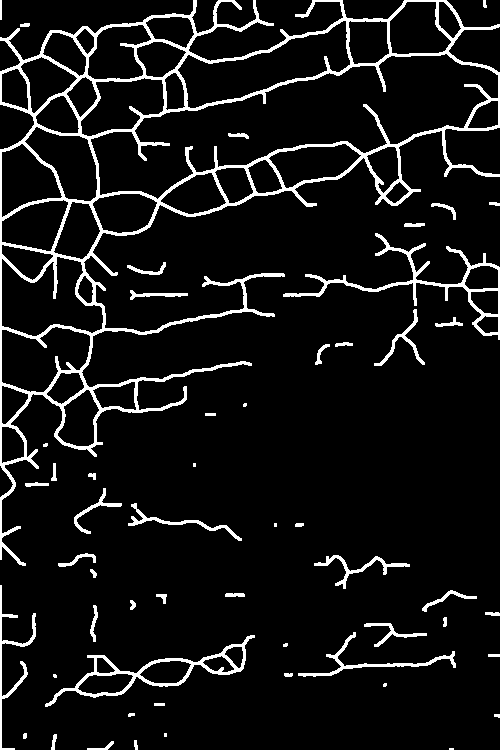

In [87]:
img_dilation  = cv2.dilate((thinned_image * 255).astype(np.uint8), np.ones((3, 3), np.uint8), iterations=1)
cv2_imshow(img_dilation)

In [88]:
lines = cv2.HoughLinesP(
    img_dilation,
    rho=1,             # Distance resolution in pixels
    theta=np.pi / 180,  # Angle resolution in radians
    threshold=100,      # Minimum number of votes for a line
    minLineLength=60,    # Minimum length of line
    maxLineGap=20       # Maximum gap between lines
)

In [89]:
len(lines)

87

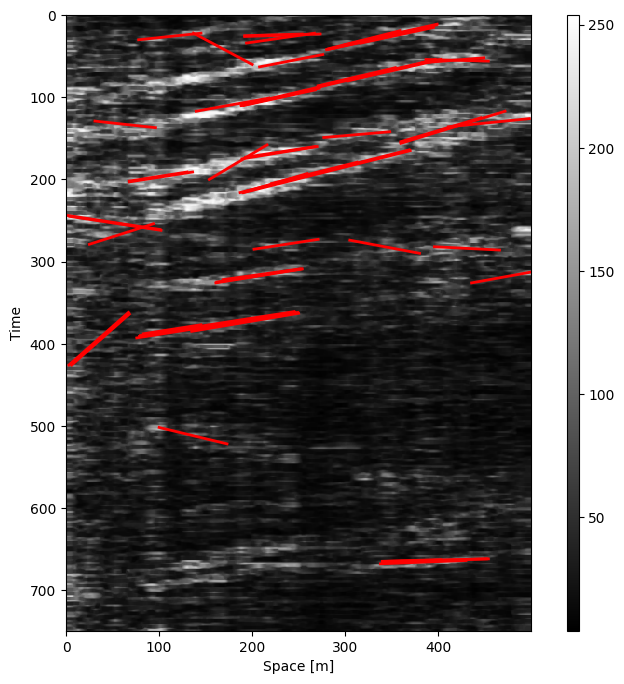

In [91]:
fig = plt.figure(figsize=(6, 8))
ax = plt.axes()

# Convert the array into a DataFrame for labeling (if necessary)
df = pd.DataFrame(data=img_erosion)
# df = pd.DataFrame(data=sudoku_edges)

# Display the image
im = ax.imshow(df, interpolation='none', aspect='auto', cmap='gray')
plt.ylabel('Time')
plt.xlabel('Space [m]')

# Colorbar
cax = fig.add_axes([ax.get_position().x1 + 0.06, ax.get_position().y0, 0.02, ax.get_position().height])
plt.colorbar(im, cax=cax)



# Plot the lines on top of the image
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        if np.abs(x1 - x2) > 0 and np.abs(y1 - y2) > 0 and np.abs(y1 - y2) <= 2* np.abs(x1 - x2):  # Filter for valid lines
            ax.plot([x1, x2], [y1, y2], color='red', linewidth=2)  # Overlay the line

# Show the plot
plt.show()

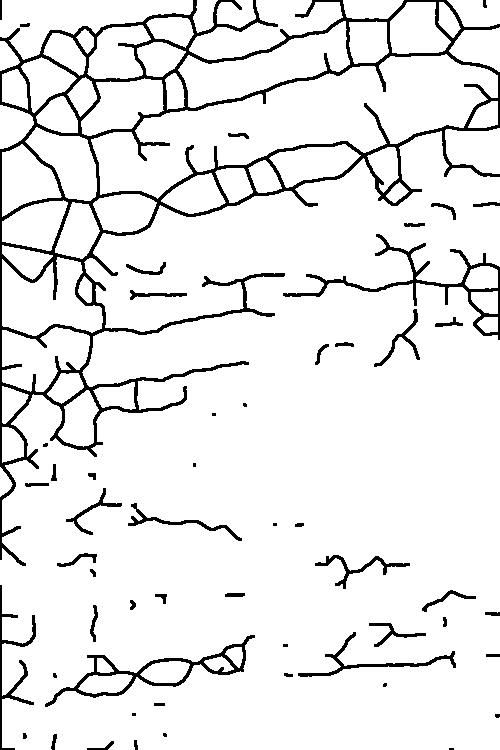

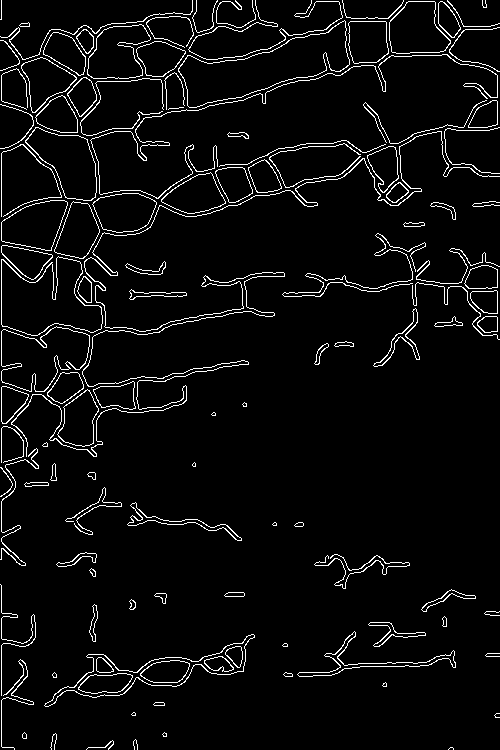

In [129]:
# sudoku_gray = (thinned_image.astype(np.uint8) * 255)

sudoku_th = cv2.adaptiveThreshold(
    255-img_dilation, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 10
)
sudoku_edges = cv2.Canny(sudoku_th, 50, 150, apertureSize=3)

cv2_imshow(sudoku_th)
cv2_imshow(sudoku_edges)

In [ ]:
from skimage import img_as_bool, io, color, morphology

In [ ]:
image = img_as_bool(arr_resized2)

In [ ]:
!pip install opencv-contrib-python

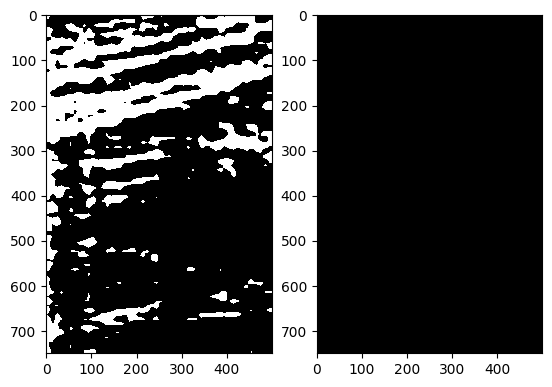

In [ ]:
out = morphology.medial_axis(image > 127)
# out = cv2.ximgproc.thinning(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))

f, (ax0, ax1) = plt.subplots(1, 2)
ax0.imshow(image, cmap='gray', interpolation='nearest')
ax1.imshow(out, cmap='gray', interpolation='nearest')
plt.show()

In [ ]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

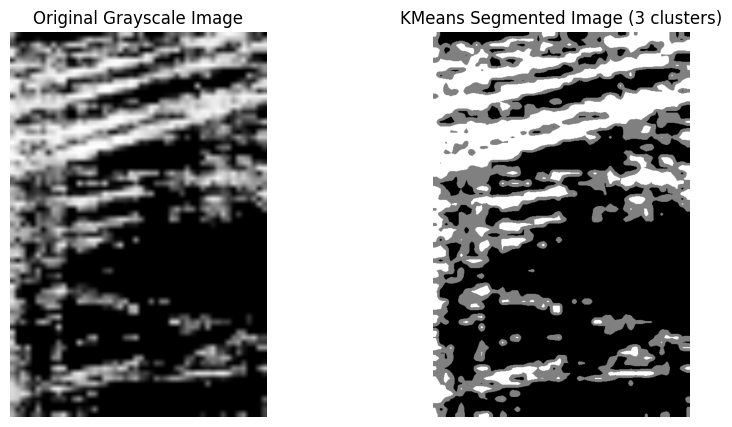

In [ ]:
pixels = arr_resized2.reshape(-1, 1)

# Number of clusters to segment the image into
number_colors = 3  # Adjust this to choose the number of intensity levels

# Apply KMeans clustering
model = KMeans(n_clusters=number_colors, random_state=0, n_init='auto')
model.fit(pixels)

# Predict the cluster for each pixel
segments = model.predict(pixels)

# Reshape the segmented labels back to the original image dimensions
segmented_image = segments.reshape(arr_resized2.shape)

# Visualize the original and segmented images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Original Grayscale Image")
plt.imshow(arr_resized2, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f"KMeans Segmented Image ({number_colors} clusters)")
plt.imshow(segmented_image, cmap='gray')
plt.axis('off')

plt.show()

In [ ]:
bilateral = cv2.bilateralFilter(arr_resized2, 15, 75, 75)

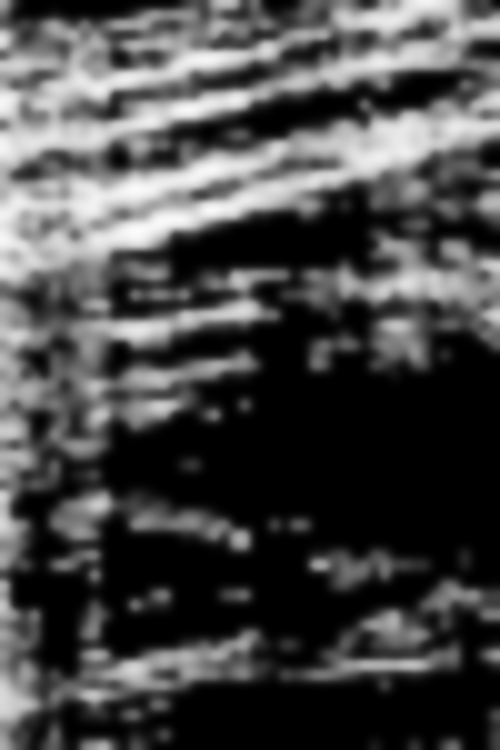

In [ ]:
cv2_imshow(bilateral)